# Introduction  
This notebook contains the implementation for generating a composite dataset by sampling 1×1 to 4×4 image grids with replacement. The dataset is structured for YOLO training, ensuring proper image-label alignment while maintaining class diversity. The notebook automates dataset creation, labeling, and train-validation splitting.  

In [ ]:
import os
import random
import numpy as np
import cv2
from pathlib import Path
import shutil
from tqdm import tqdm
import matplotlib.pyplot as plt
from collections import Counter
import random
%matplotlib inline

# Creation of composite Dataset

Starting with a small test dataset...
Starting composite dataset generation...
Loaded 1218 images for class basophil
Loaded 3117 images for class eosinophil
Loaded 1551 images for class erythroblast
Loaded 2895 images for class immunoglobin
Loaded 1214 images for class lymphocyte
Loaded 1420 images for class monocyte
Loaded 3329 images for class neutrophil
Loaded 2348 images for class platelet
Loaded 870 images for class lymphoblast
Generating 5 samples for 1x1 grid...


100%|██████████| 5/5 [00:00<00:00, 615.99it/s]


Generating 5 samples for 2x2 grid...


100%|██████████| 5/5 [00:00<00:00, 158.01it/s]


Generating 5 samples for 3x3 grid...


100%|██████████| 5/5 [00:00<00:00, 77.27it/s]


Generating 5 samples for 4x4 grid...


100%|██████████| 5/5 [00:00<00:00, 44.59it/s]


Creating train/val split...
Split 1x1: 4 training, 1 validation
Split 2x2: 4 training, 1 validation
Split 3x3: 4 training, 1 validation
Split 4x4: 4 training, 1 validation
Created dataset.yaml at composite_data/dataset.yaml
Visualizing samples...


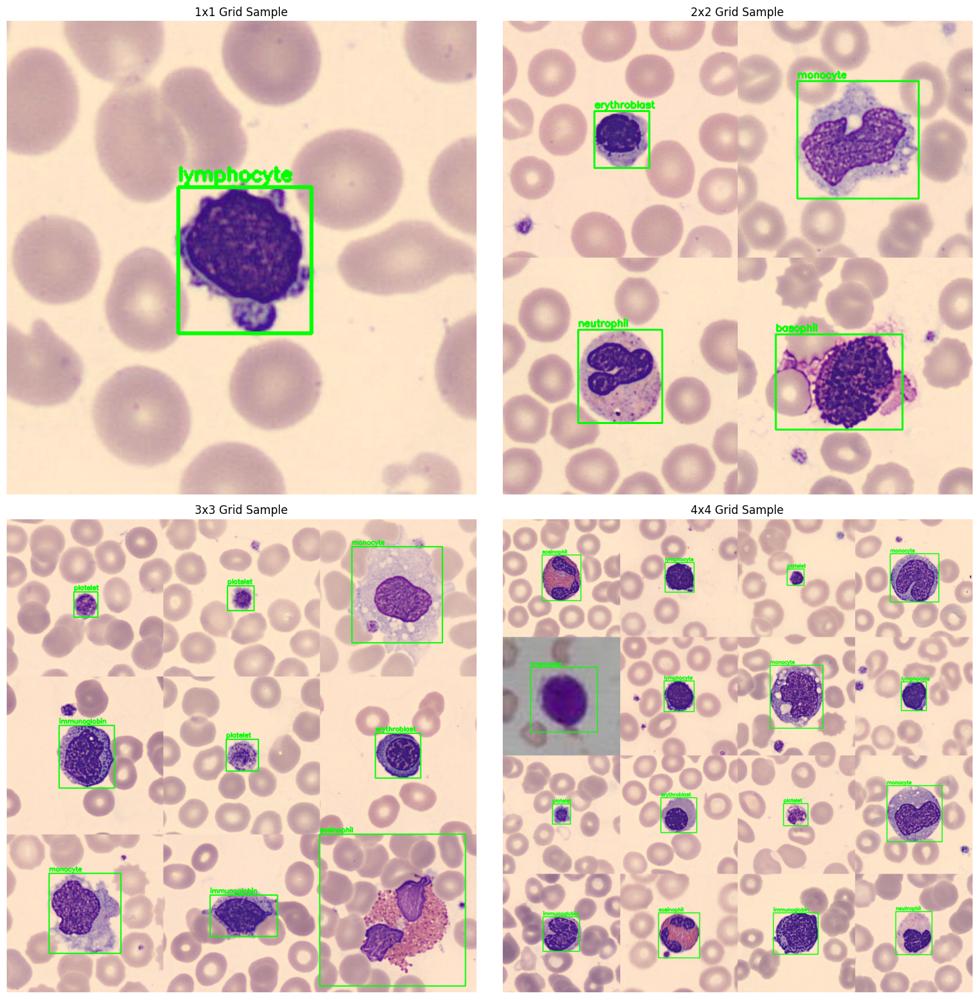

Generating full dataset...
Starting composite dataset generation...
Loaded 1218 images for class basophil
Loaded 3117 images for class eosinophil
Loaded 1551 images for class erythroblast
Loaded 2895 images for class immunoglobin
Loaded 1214 images for class lymphocyte
Loaded 1420 images for class monocyte
Loaded 3329 images for class neutrophil
Loaded 2348 images for class platelet
Loaded 870 images for class lymphoblast
Generating 2000 samples for 1x1 grid...


100%|██████████| 2000/2000 [00:03<00:00, 636.73it/s]


Generating 2000 samples for 2x2 grid...


100%|██████████| 2000/2000 [00:09<00:00, 204.93it/s]


Generating 2000 samples for 3x3 grid...


100%|██████████| 2000/2000 [00:19<00:00, 103.28it/s]


Generating 2000 samples for 4x4 grid...


100%|██████████| 2000/2000 [00:31<00:00, 63.48it/s]


Creating train/val split...
Split 1x1: 1600 training, 400 validation
Split 2x2: 1600 training, 400 validation
Split 3x3: 1600 training, 400 validation
Split 4x4: 1600 training, 400 validation
Created dataset.yaml at composite_data/dataset.yaml
Dataset generation complete!


In [ ]:
# Define your class names
class_names = ['basophil', 'eosinophil', 'erythroblast', 'immunoglobin',
               'lymphocyte', 'monocyte', 'neutrophil', 'platelet', 'lymphoblast']

# Define directories
source_dir = "data"
output_dir = "composite_data"

# Make sure output directory exists
os.makedirs(output_dir, exist_ok=True)

# Function to generate composite images and YOLO labels
def generate_composite_dataset(source_dir="data", output_dir="composite_data", 
                              samples_per_grid=50, train_ratio=0.8):
    """Generate a composite image dataset for YOLO training"""
    print("Starting composite dataset generation...")
    
    source_dir = Path(source_dir)
    output_dir = Path(output_dir)
    img_size = (360, 363)  # Original image dimensions
    
    # Create directories for different grid sizes and train/val splits
    for grid_size in ['1x1', '2x2', '3x3', '4x4']:
        (output_dir / grid_size / 'images').mkdir(parents=True, exist_ok=True)
        (output_dir / grid_size / 'labels').mkdir(parents=True, exist_ok=True)
    
    for split in ['train', 'val']:
        (output_dir / split / 'images').mkdir(parents=True, exist_ok=True)
        (output_dir / split / 'labels').mkdir(parents=True, exist_ok=True)
    
    # Load image paths for each class
    class_images = {}
    for class_name in class_names:
        class_dir = source_dir / class_name / 'images'
        if class_dir.exists():
            image_paths = list(class_dir.glob('*.jpg')) + list(class_dir.glob('*.png'))
            class_images[class_name] = image_paths
            print(f"Loaded {len(image_paths)} images for class {class_name}")
        else:
            print(f"WARNING: Directory not found: {class_dir}")
    
    width, height = img_size
    
    # Generate images for each grid size
    for grid_size in [1, 2, 3, 4]:
        print(f"Generating {samples_per_grid} samples for {grid_size}x{grid_size} grid...")
        
        for idx in tqdm(range(samples_per_grid)):
            # Create empty composite image
            composite_img = np.zeros((grid_size * height, grid_size * width, 3), dtype=np.uint8)
            composite_labels = []
            
            # Fill each cell in the grid
            for i in range(grid_size):
                for j in range(grid_size):
                    # Select random class with available images
                    available_classes = [c for c in class_names if c in class_images and class_images[c]]
                    if not available_classes:
                        print("ERROR: No classes with available images found!")
                        return
                    
                    class_name = random.choice(available_classes)
                    img_path = random.choice(class_images[class_name])
                    class_idx = class_names.index(class_name)
                    
                    # Read image
                    img = cv2.imread(str(img_path))
                    if img is None:
                        print(f"Warning: Could not read image {img_path}")
                        img = np.ones((height, width, 3), dtype=np.uint8) * 200  # Gray placeholder
                    else:
                        # Resize if needed
                        if img.shape[0] != height or img.shape[1] != width:
                            img = cv2.resize(img, (width, height))
                    
                    # Place image in grid
                    y_start = i * height
                    y_end = (i + 1) * height
                    x_start = j * width
                    x_end = (j + 1) * width
                    composite_img[y_start:y_end, x_start:x_end] = img
                    
                    # Get corresponding label path
                    label_path = source_dir / class_name / 'labels' / f"{img_path.stem}.txt"
                    
                    # If label exists, adjust coordinates for new position
                    if label_path.exists():
                        with open(label_path, 'r') as f:
                            for line in f:
                                parts = line.strip().split()
                                if len(parts) >= 5:
                                    x_center = float(parts[1])
                                    y_center = float(parts[2])
                                    width_norm = float(parts[3])
                                    height_norm = float(parts[4])
                                    
                                    # Adjust coordinates for composite image
                                    new_x_center = (x_center + j) / grid_size
                                    new_y_center = (y_center + i) / grid_size
                                    new_width = width_norm / grid_size
                                    new_height = height_norm / grid_size
                                    
                                    composite_labels.append((class_idx, new_x_center, new_y_center, 
                                                          new_width, new_height))
                    else:
                        # If no label, create one for the entire cell
                        new_x_center = (0.5 + j) / grid_size
                        new_y_center = (0.5 + i) / grid_size
                        new_width = 0.9 / grid_size  # Slightly smaller than the cell
                        new_height = 0.9 / grid_size
                        
                        composite_labels.append((class_idx, new_x_center, new_y_center, 
                                              new_width, new_height))
            
            # Save composite image and labels
            img_filename = f"{grid_size}x{grid_size}_{idx:04d}.jpg"
            label_filename = f"{grid_size}x{grid_size}_{idx:04d}.txt"
            
            img_path = output_dir / f"{grid_size}x{grid_size}" / "images" / img_filename
            label_path = output_dir / f"{grid_size}x{grid_size}" / "labels" / label_filename
            
            cv2.imwrite(str(img_path), composite_img)
            
            with open(label_path, 'w') as f:
                for class_id, x, y, w, h in composite_labels:
                    f.write(f"{class_id} {x:.6f} {y:.6f} {w:.6f} {h:.6f}\n")
    
    print("Creating train/val split...")
    # Create train/val split
    for grid_size in ['1x1', '2x2', '3x3', '4x4']:
        # Get all images in this grid
        img_dir = output_dir / grid_size / 'images'
        images = list(img_dir.glob('*.jpg'))
        
        # Shuffle images
        random.shuffle(images)
        
        # Split into train/val
        split_idx = int(len(images) * train_ratio)
        train_images = images[:split_idx]
        val_images = images[split_idx:]
        
        # Copy files to train/val directories
        for img_path in train_images:
            img_name = img_path.name
            label_name = img_path.stem + '.txt'
            label_path = output_dir / grid_size / 'labels' / label_name
            
            shutil.copy(img_path, output_dir / 'train' / 'images' / img_name)
            shutil.copy(label_path, output_dir / 'train' / 'labels' / label_name)
        
        for img_path in val_images:
            img_name = img_path.name
            label_name = img_path.stem + '.txt'
            label_path = output_dir / grid_size / 'labels' / label_name
            
            shutil.copy(img_path, output_dir / 'val' / 'images' / img_name)
            shutil.copy(label_path, output_dir / 'val' / 'labels' / label_name)
            
        print(f"Split {grid_size}: {len(train_images)} training, {len(val_images)} validation")
    
    # Create YOLO dataset.yaml
    yaml_content = f"""path: {str(output_dir.absolute())}
train: train/images
val: val/images

names:
"""
    
    # Add class names
    for idx, name in enumerate(class_names):
        yaml_content += f"  {idx}: {name}\n"
    
    # Write YAML file
    with open(output_dir / 'dataset.yaml', 'w') as f:
        f.write(yaml_content)
    
    print(f"Created dataset.yaml at {output_dir / 'dataset.yaml'}")
    return output_dir

# Function to visualize samples
def visualize_samples(output_dir="composite_data"):
    """Visualize sample images from each grid size"""
    output_dir = Path(output_dir)
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 15))
    axes = axes.flatten()
    
    for i, grid_size in enumerate([1, 2, 3, 4]):
        grid_dir = output_dir / f"{grid_size}x{grid_size}"
        img_dir = grid_dir / "images"
        label_dir = grid_dir / "labels"
        
        if not img_dir.exists() or not label_dir.exists():
            axes[i].text(0.5, 0.5, f"No {grid_size}x{grid_size} samples found", 
                         ha='center', va='center')
            axes[i].axis('off')
            continue
        
        # Find first image
        img_files = list(img_dir.glob("*.jpg"))
        if not img_files:
            axes[i].text(0.5, 0.5, f"No {grid_size}x{grid_size} samples found", 
                         ha='center', va='center')
            axes[i].axis('off')
            continue
        
        img_path = img_files[0]
        label_path = label_dir / f"{img_path.stem}.txt"
        
        # Read and display image
        img = cv2.imread(str(img_path))
        if img is None:
            axes[i].text(0.5, 0.5, f"Failed to read {img_path.name}", 
                         ha='center', va='center')
            axes[i].axis('off')
            continue
        
        h, w = img.shape[:2]
        
        # Draw bounding boxes if label exists
        if label_path.exists():
            with open(label_path, 'r') as f:
                lines = f.readlines()
            
            for line in lines:
                parts = line.strip().split()
                if len(parts) >= 5:
                    class_id = int(parts[0])
                    x_center = float(parts[1]) * w
                    y_center = float(parts[2]) * h
                    width = float(parts[3]) * w
                    height = float(parts[4]) * h
                    
                    # Calculate bounding box coordinates
                    x1 = int(max(0, x_center - width / 2))
                    y1 = int(max(0, y_center - height / 2))
                    x2 = int(min(w-1, x_center + width / 2))
                    y2 = int(min(h-1, y_center + height / 2))
                    
                    # Draw rectangle
                    cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
                    
                    # Draw class name
                    class_name = class_names[class_id] if class_id < len(class_names) else f"Class {class_id}"
                    cv2.putText(img, class_name, (x1, y1 - 5), 
                               cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        
        # Convert from BGR to RGB for matplotlib
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i].imshow(img_rgb)
        axes[i].set_title(f"{grid_size}x{grid_size} Grid Sample")
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

# Main execution block
def main():
    # Generate a small test dataset first
    print("Starting with a small test dataset...")
    generate_composite_dataset(samples_per_grid=5)
    
    # Visualize samples
    print("Visualizing samples...")
    visualize_samples()
    
    # Ask for confirmation before generating full dataset
    response = input("Generate full dataset? (y/n): ")
    if response.lower() == 'y':
        print("Generating full dataset...")
        generate_composite_dataset(samples_per_grid=2000)
        print("Dataset generation complete!")
        
    else:
        print("Full dataset generation skipped.")

# Run the script
if __name__ == "__main__":
    main()
else:
    # For notebook-style execution
    print("Functions loaded. Use the following commands to generate the dataset:")
    print("1. generate_composite_dataset(samples_per_grid=5)  # Test with few samples")
    print("2. visualize_samples()  # View sample results")
    print("3. generate_composite_dataset(samples_per_grid=100)  # Generate full dataset")

# Dataset Compostion


TRAIN SET STATISTICS:
Total objects: 48094
Class distribution:
  basophil: 5470 (11.37%)
  eosinophil: 5282 (10.98%)
  erythroblast: 5421 (11.27%)
  immunoglobin: 5278 (10.97%)
  lymphocyte: 5337 (11.10%)
  monocyte: 5185 (10.78%)
  neutrophil: 5270 (10.96%)
  platelet: 5390 (11.21%)
  lymphoblast: 5461 (11.35%)

VAL SET STATISTICS:
Total objects: 12059
Class distribution:
  basophil: 1315 (10.90%)
  eosinophil: 1384 (11.48%)
  erythroblast: 1312 (10.88%)
  immunoglobin: 1347 (11.17%)
  lymphocyte: 1361 (11.29%)
  monocyte: 1309 (10.85%)
  neutrophil: 1315 (10.90%)
  platelet: 1346 (11.16%)
  lymphoblast: 1370 (11.36%)


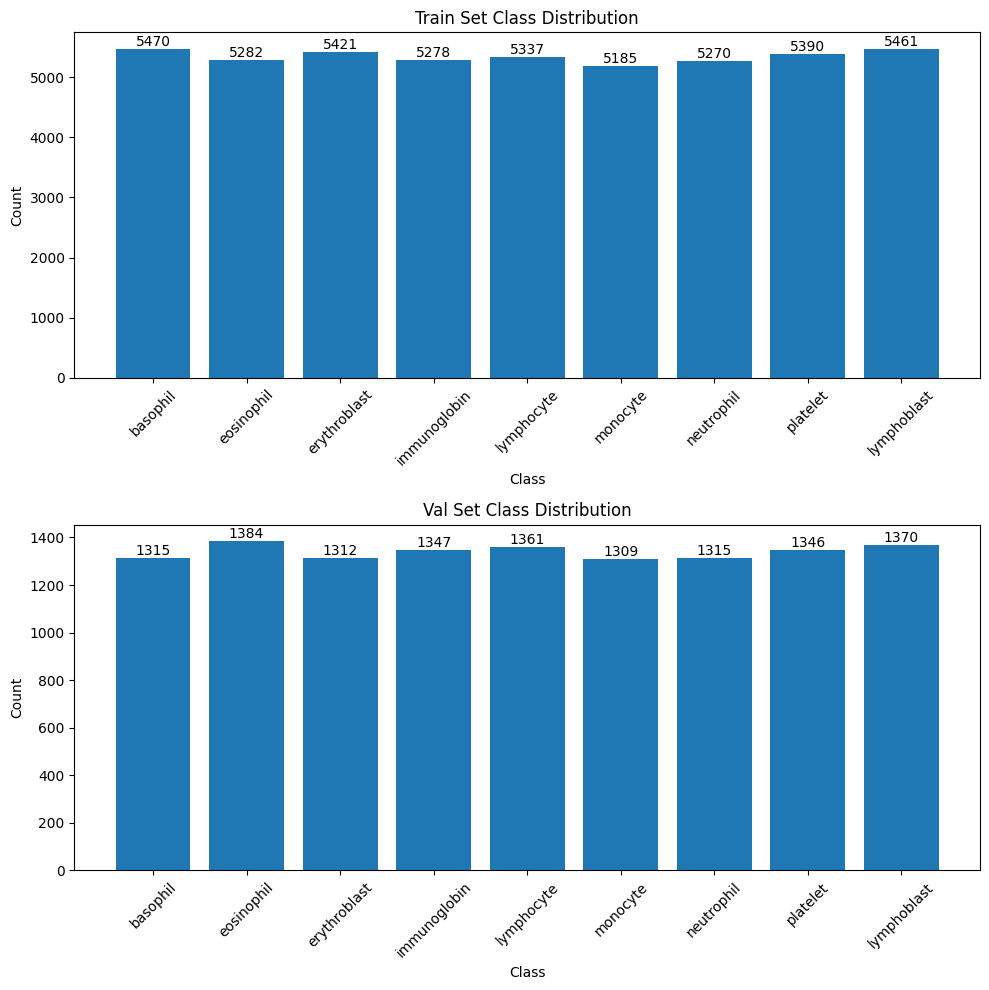

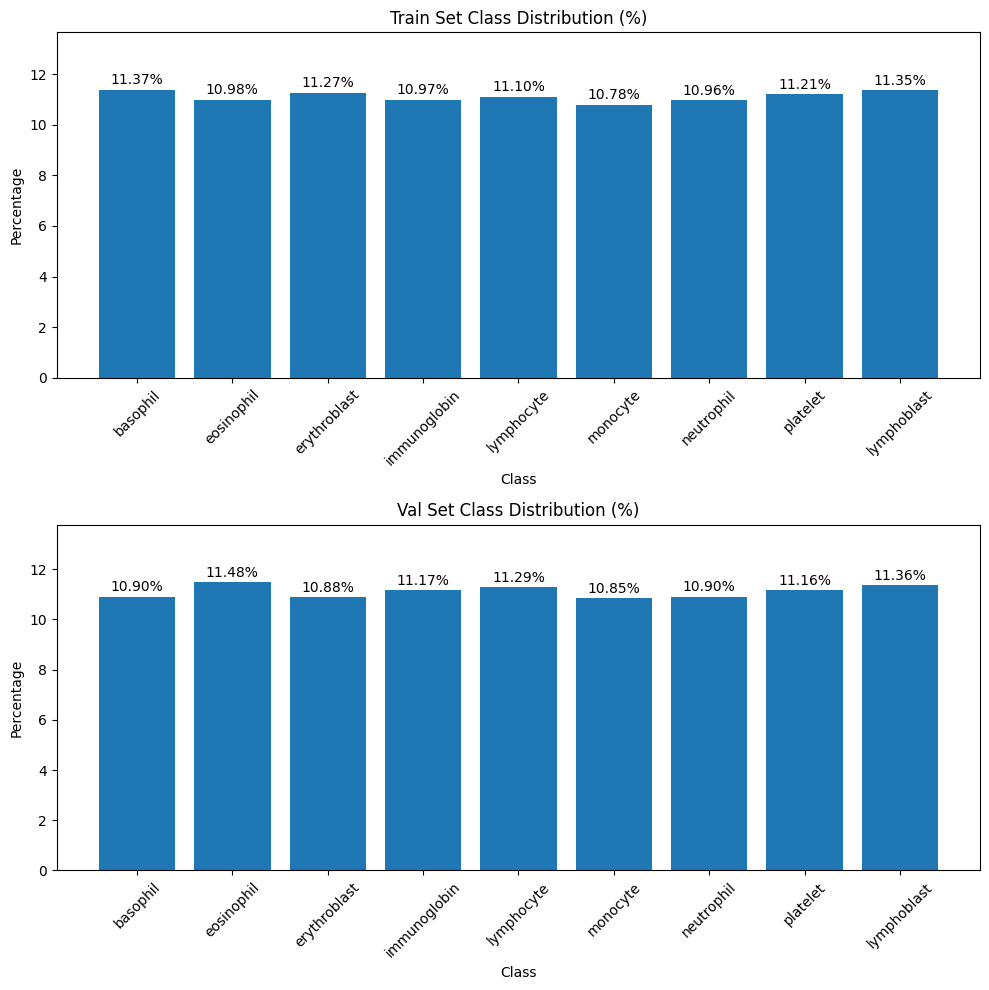


COMPARISON BETWEEN TRAIN AND VAL SETS:
  basophil: Train 11.37% vs Val 10.90% (Diff: 0.47%)
  eosinophil: Train 10.98% vs Val 11.48% (Diff: 0.49%)
  erythroblast: Train 11.27% vs Val 10.88% (Diff: 0.39%)
  immunoglobin: Train 10.97% vs Val 11.17% (Diff: 0.20%)
  lymphocyte: Train 11.10% vs Val 11.29% (Diff: 0.19%)
  monocyte: Train 10.78% vs Val 10.85% (Diff: 0.07%)
  neutrophil: Train 10.96% vs Val 10.90% (Diff: 0.05%)
  platelet: Train 11.21% vs Val 11.16% (Diff: 0.05%)
  lymphoblast: Train 11.35% vs Val 11.36% (Diff: 0.01%)


In [ ]:
def calculate_class_distribution(dataset_dir='composite_data', 
                                 splits=['train', 'val'],
                                 class_names=None):
    """
    Calculate and visualize class distribution in YOLO dataset.
    
    Args:
        dataset_dir: Path to the dataset directory
        splits: List of dataset splits to analyze (e.g., ['train', 'val'])
        class_names: List of class names corresponding to class indices
    
    Returns:
        Dictionary with class distribution counts for each split
    """
    if class_names is None:
        # Use the class names from the code
        class_names = ['basophil', 'eosinophil', 'erythroblast', 'immunoglobin',
                      'lymphocyte', 'monocyte', 'neutrophil', 'platelet', 'lymphoblast']
    
    dataset_path = Path(dataset_dir)
    results = {}
    
    for split in splits:
        # Path to the labels directory for this split
        labels_dir = dataset_path / split / 'labels'
        
        if not labels_dir.exists():
            print(f"Directory not found: {labels_dir}")
            continue
        
        # Counter to store class frequencies
        class_counter = Counter()
        
        # Counter for total objects
        total_objects = 0
        
        # Iterate through all label files
        for label_file in labels_dir.glob('*.txt'):
            with open(label_file, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        class_id = int(parts[0])
                        class_counter[class_id] += 1
                        total_objects += 1
        
        # Store results
        results[split] = {
            'counts': class_counter,
            'total': total_objects
        }
        
        # Print statistics
        print(f"\n{split.upper()} SET STATISTICS:")
        print(f"Total objects: {total_objects}")
        print("Class distribution:")
        
        # Sort by class ID
        for class_id in sorted(class_counter.keys()):
            class_name = class_names[class_id] if class_id < len(class_names) else f"Unknown ({class_id})"
            count = class_counter[class_id]
            percentage = (count / total_objects) * 100 if total_objects > 0 else 0
            print(f"  {class_name}: {count} ({percentage:.2f}%)")
    
    # Visualize results
    visualize_distribution(results, class_names)
    
    return results

def visualize_distribution(results, class_names):
    """
    Visualize the class distribution as bar charts.
    
    Args:
        results: Dictionary with class distribution results
        class_names: List of class names
    """
    # Number of splits to visualize
    n_splits = len(results)
    
    # Create figure with subplots
    fig, axes = plt.subplots(n_splits, 1, figsize=(10, 5 * n_splits))
    if n_splits == 1:
        axes = [axes]
    
    for i, (split, data) in enumerate(results.items()):
        # Get class counts and order them
        class_ids = sorted(data['counts'].keys())
        counts = [data['counts'][class_id] for class_id in class_ids]
        
        # Get class names for the x-axis
        labels = [class_names[class_id] if class_id < len(class_names) else f"Unknown ({class_id})" 
                 for class_id in class_ids]
        
        # Create bar chart
        bars = axes[i].bar(labels, counts)
        axes[i].set_title(f'{split.capitalize()} Set Class Distribution')
        axes[i].set_xlabel('Class')
        axes[i].set_ylabel('Count')
        axes[i].tick_params(axis='x', rotation=45)
        
        # Add count labels on top of bars
        for bar in bars:
            height = bar.get_height()
            axes[i].text(bar.get_x() + bar.get_width()/2., height + 0.1,
                        f'{int(height)}', ha='center', va='bottom')
    
    plt.tight_layout()
    plt.show()
    
    # Create a percentage distribution plot
    fig, axes = plt.subplots(n_splits, 1, figsize=(10, 5 * n_splits))
    if n_splits == 1:
        axes = [axes]
    
    for i, (split, data) in enumerate(results.items()):
        # Get class counts and calculate percentages
        total = data['total']
        class_ids = sorted(data['counts'].keys())
        percentages = [data['counts'][class_id] / total * 100 if total > 0 else 0 
                      for class_id in class_ids]
        
        # Get class names for the x-axis
        labels = [class_names[class_id] if class_id < len(class_names) else f"Unknown ({class_id})" 
                 for class_id in class_ids]
        
        # Create bar chart
        bars = axes[i].bar(labels, percentages)
        axes[i].set_title(f'{split.capitalize()} Set Class Distribution (%)')
        axes[i].set_xlabel('Class')
        axes[i].set_ylabel('Percentage')
        axes[i].set_ylim(0, max(percentages) * 1.2)  # Give some headroom
        axes[i].tick_params(axis='x', rotation=45)
        
        # Add percentage labels on top of bars
        for bar in bars:
            height = bar.get_height()
            axes[i].text(bar.get_x() + bar.get_width()/2., height + 0.1,
                        f'{height:.2f}%', ha='center', va='bottom')
    
    plt.tight_layout()
    plt.show()

# Example usage
if __name__ == "__main__":
    # Specify the path to your dataset
    dataset_dir = "composite_data"
    
    # Define class names (these should match the ones in your dataset)
    class_names = ['basophil', 'eosinophil', 'erythroblast', 'immunoglobin',
                  'lymphocyte', 'monocyte', 'neutrophil', 'platelet', 'lymphoblast']
    
    # Calculate distribution
    results = calculate_class_distribution(dataset_dir, ['train', 'val'], class_names)
    
    # Additional analysis - Compare distributions between train and val
    if 'train' in results and 'val' in results:
        print("\nCOMPARISON BETWEEN TRAIN AND VAL SETS:")
        
        train_counts = results['train']['counts']
        val_counts = results['val']['counts']
        
        all_classes = sorted(set(list(train_counts.keys()) + list(val_counts.keys())))
        
        for class_id in all_classes:
            class_name = class_names[class_id] if class_id < len(class_names) else f"Unknown ({class_id})"
            train_count = train_counts.get(class_id, 0)
            val_count = val_counts.get(class_id, 0)
            
            train_total = results['train']['total']
            val_total = results['val']['total']
            
            train_pct = (train_count / train_total) * 100 if train_total > 0 else 0
            val_pct = (val_count / val_total) * 100 if val_total > 0 else 0
            
            pct_diff = abs(train_pct - val_pct)
            
            print(f"  {class_name}: Train {train_pct:.2f}% vs Val {val_pct:.2f}% (Diff: {pct_diff:.2f}%)")

# Visualize the images

Visualizing random images from training set:


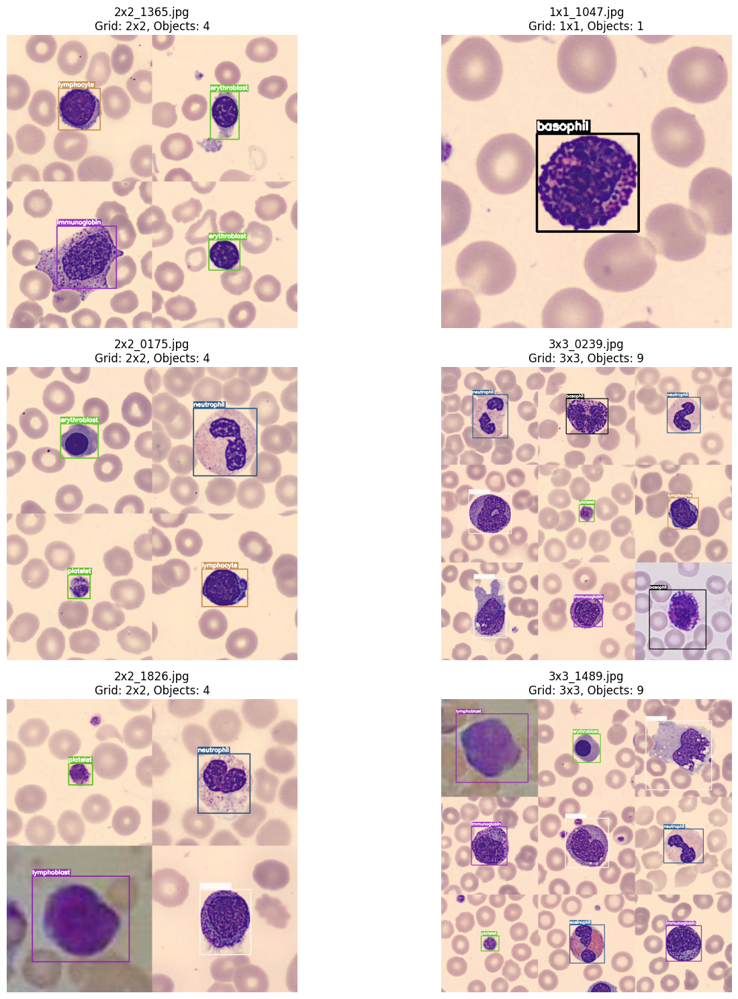


Visualizing random images from validation set:


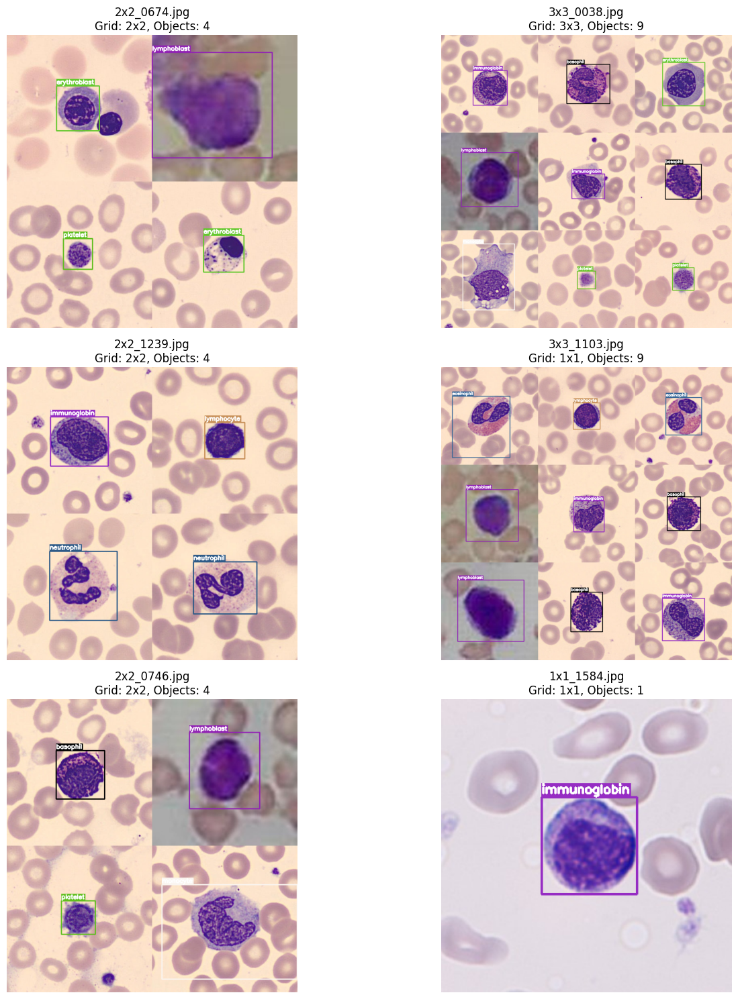


Visualizing examples from each grid size:

Visualizing random sample from 1x1 grid:


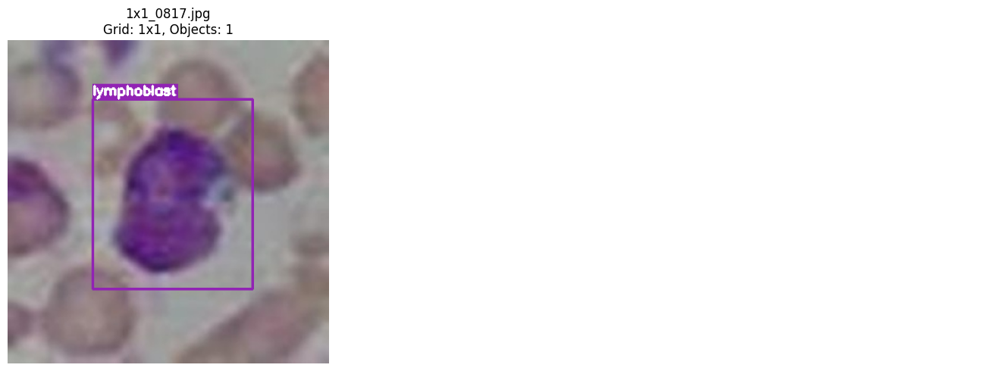


Visualizing random sample from 2x2 grid:


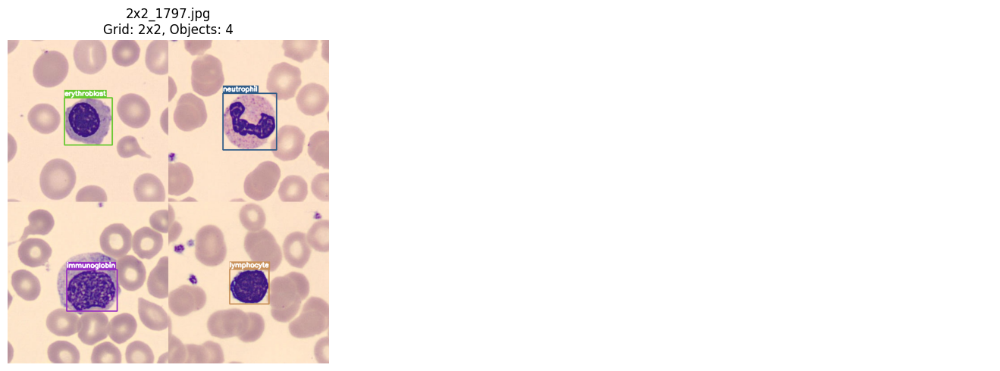


Visualizing random sample from 3x3 grid:


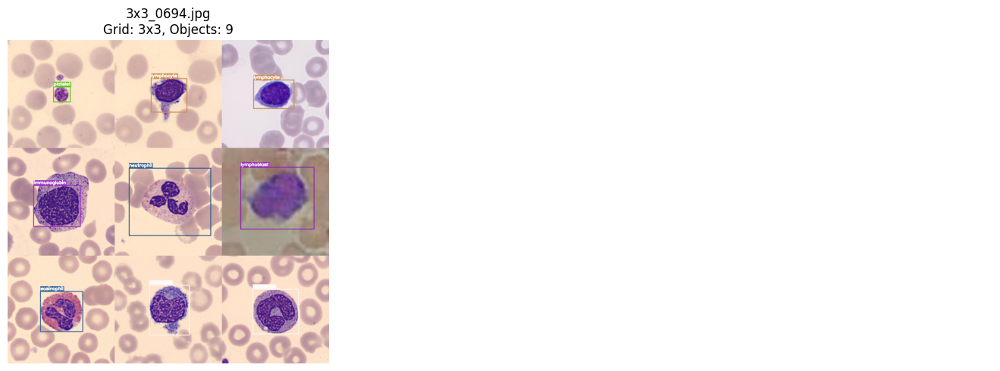


Visualizing random sample from 4x4 grid:


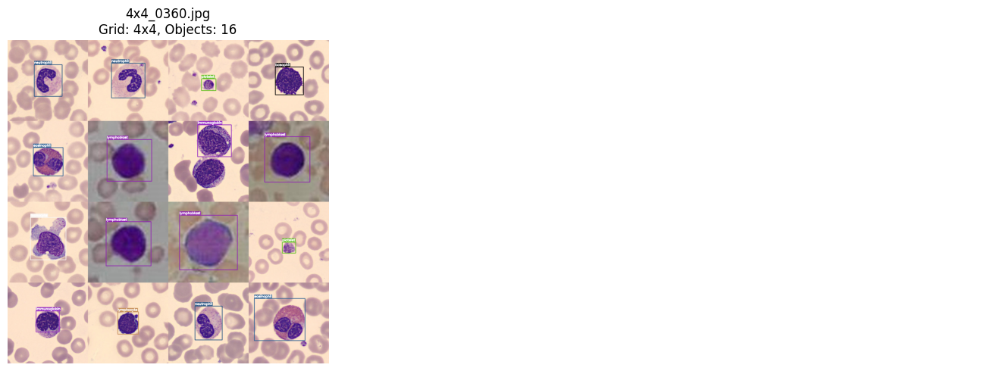

In [ ]:
def visualize_random_yolo_labels(dataset_dir='composite_data', 
                                split='train', 
                                num_samples=4, 
                                class_names=None,
                                grid_sizes=None):
    """
    Visualize random images with their YOLO bounding boxes.
    
    Args:
        dataset_dir: Path to the dataset directory
        split: Dataset split to analyze ('train' or 'val')
        num_samples: Number of random samples to display
        class_names: List of class names corresponding to class indices
        grid_sizes: List of grid sizes to sample from (e.g., ['1x1', '2x2', '3x3', '4x4'])
    """
    if class_names is None:
        class_names = ['basophil', 'eosinophil', 'erythroblast', 'immunoglobin',
                      'lymphocyte', 'monocyte', 'neutrophil', 'platelet', 'lymphoblast']
    
    # Default grid sizes if not specified
    if grid_sizes is None:
        grid_sizes = ['1x1', '2x2', '3x3', '4x4']
        
    dataset_path = Path(dataset_dir)
    
    # Path to images and labels
    split_path = dataset_path / split
    images_path = split_path / 'images'
    labels_path = split_path / 'labels'
    
    if not images_path.exists() or not labels_path.exists():
        print(f"Directory not found. Check if {split_path} exists and has images/labels folders.")
        return
    
    # Get all image paths
    all_images = list(images_path.glob('*.jpg')) + list(images_path.glob('*.png'))
    
    if not all_images:
        print(f"No images found in {images_path}")
        return
        
    # Filter by grid size if specified
    if grid_sizes:
        filtered_images = []
        for img_path in all_images:
            # Extract grid size from filename (e.g., "1x1_0001.jpg")
            for grid_size in grid_sizes:
                if img_path.name.startswith(f"{grid_size}_") or img_path.name.startswith(f"{grid_size.replace('x', '')}_"):
                    filtered_images.append(img_path)
                    break
        
        # Use filtered list if not empty, otherwise use all images
        selected_images = filtered_images if filtered_images else all_images
    else:
        selected_images = all_images
    
    # Sample random images
    if len(selected_images) < num_samples:
        samples = selected_images
        print(f"Warning: Only {len(samples)} images available, showing all of them.")
    else:
        samples = random.sample(selected_images, num_samples)
    
    # Setup plotting
    fig_width = 15
    fig_height = 5 * ((num_samples + 1) // 2)  # Adjust height based on number of samples
    fig, axes = plt.subplots(((num_samples + 1) // 2), 2, figsize=(fig_width, fig_height))
    
    # Convert to 1D array if only 1 sample
    if num_samples == 1:
        axes = np.array([axes])
    
    # Flatten axes for easy iteration
    axes = axes.flatten()
    
    # Display each sample
    for i, img_path in enumerate(samples):
        if i >= len(axes):
            break
            
        # Get corresponding label path
        label_path = labels_path / f"{img_path.stem}.txt"
        
        # Read image
        img = cv2.imread(str(img_path))
        if img is None:
            axes[i].text(0.5, 0.5, f"Failed to read {img_path.name}", 
                         ha='center', va='center', fontsize=12)
            axes[i].axis('off')
            continue
            
        # Convert from BGR to RGB for matplotlib
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]
        
        # Create a copy for drawing
        img_with_boxes = img_rgb.copy()
        
        # Read and draw labels if they exist
        if label_path.exists():
            with open(label_path, 'r') as f:
                lines = f.readlines()
                
            # Display how many objects are in this image
            num_objects = len(lines)
            
            # Draw each bounding box
            for line in lines:
                parts = line.strip().split()
                if len(parts) >= 5:
                    class_id = int(parts[0])
                    x_center = float(parts[1]) * w
                    y_center = float(parts[2]) * h
                    width = float(parts[3]) * w
                    height = float(parts[4]) * h
                    
                    # Calculate bounding box coordinates
                    x1 = int(max(0, x_center - width / 2))
                    y1 = int(max(0, y_center - height / 2))
                    x2 = int(min(w-1, x_center + width / 2))
                    y2 = int(min(h-1, y_center + height / 2))
                    
                    # Generate a random color based on class id
                    color = np.array([
                        (class_id * 50) % 255,  # R
                        (class_id * 100) % 255,  # G
                        (class_id * 150) % 255   # B
                    ], dtype=np.uint8)
                    color = tuple(map(int, color))
                    
                    # Draw rectangle
                    cv2.rectangle(img_with_boxes, (x1, y1), (x2, y2), color, 2)
                    
                    # Get class name
                    class_name = class_names[class_id] if class_id < len(class_names) else f"Class {class_id}"
                    
                    # Draw label background
                    text_size = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)[0]
                    cv2.rectangle(img_with_boxes, (x1, y1 - text_size[1] - 5), (x1 + text_size[0], y1), color, -1)
                    
                    # Draw class name
                    cv2.putText(img_with_boxes, class_name, (x1, y1 - 5),
                              cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)
            
            # Display image with bounding boxes
            axes[i].imshow(img_with_boxes)
            
            # Extract grid size from filename
            grid_size = None
            for size in ['1x1', '2x2', '3x3', '4x4']:
                if size in img_path.name or size.replace('x', '') in img_path.name:
                    grid_size = size
                    break
                    
            # Set title with image information
            title = f"{img_path.name}\nGrid: {grid_size}, Objects: {num_objects}"
            axes[i].set_title(title)
        else:
            # No labels found
            axes[i].imshow(img_rgb)
            axes[i].set_title(f"{img_path.name}\nNo labels found")
        
        axes[i].axis('off')
    
    # Hide unused subplots
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

# Function to visualize images from specific grid sizes
def visualize_grid_examples(dataset_dir='composite_data', 
                            split='train',
                            class_names=None):
    """
    Visualize one example from each grid size (1x1, 2x2, 3x3, 4x4).
    """
    # Use the main function with explicit grid sizes
    grid_sizes = ['1x1', '2x2', '3x3', '4x4']
    for grid_size in grid_sizes:
        print(f"\nVisualizing random sample from {grid_size} grid:")
        visualize_random_yolo_labels(dataset_dir, split, 1, class_names, [grid_size])

# Example usage
if __name__ == "__main__":
    # Define your class names
    class_names = ['basophil', 'eosinophil', 'erythroblast', 'immunoglobin',
                  'lymphocyte', 'monocyte', 'neutrophil', 'platelet', 'lymphoblast']
    
    print("Visualizing random images from training set:")
    visualize_random_yolo_labels('composite_data', 'train', 6, class_names)
    
    print("\nVisualizing random images from validation set:")
    visualize_random_yolo_labels('composite_data', 'val', 6, class_names)
    
    print("\nVisualizing examples from each grid size:")
    visualize_grid_examples('composite_data', 'train', class_names)

# Prediction

Detected grid size from filename: 4x4

image 1/1 /Users/afnanag/projects/DH307/yolov11/augmentation/composite_data/val/images/4x4_1148.jpg: 384x384 2 basophils, 1 eosinophil, 2 immature granulocytes, 3 lymphocytes, 2 monocytes, 2 neutrophils, 1 platelets, 3 lymphoblasts, 72.7ms
Speed: 0.8ms preprocess, 72.7ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 384)


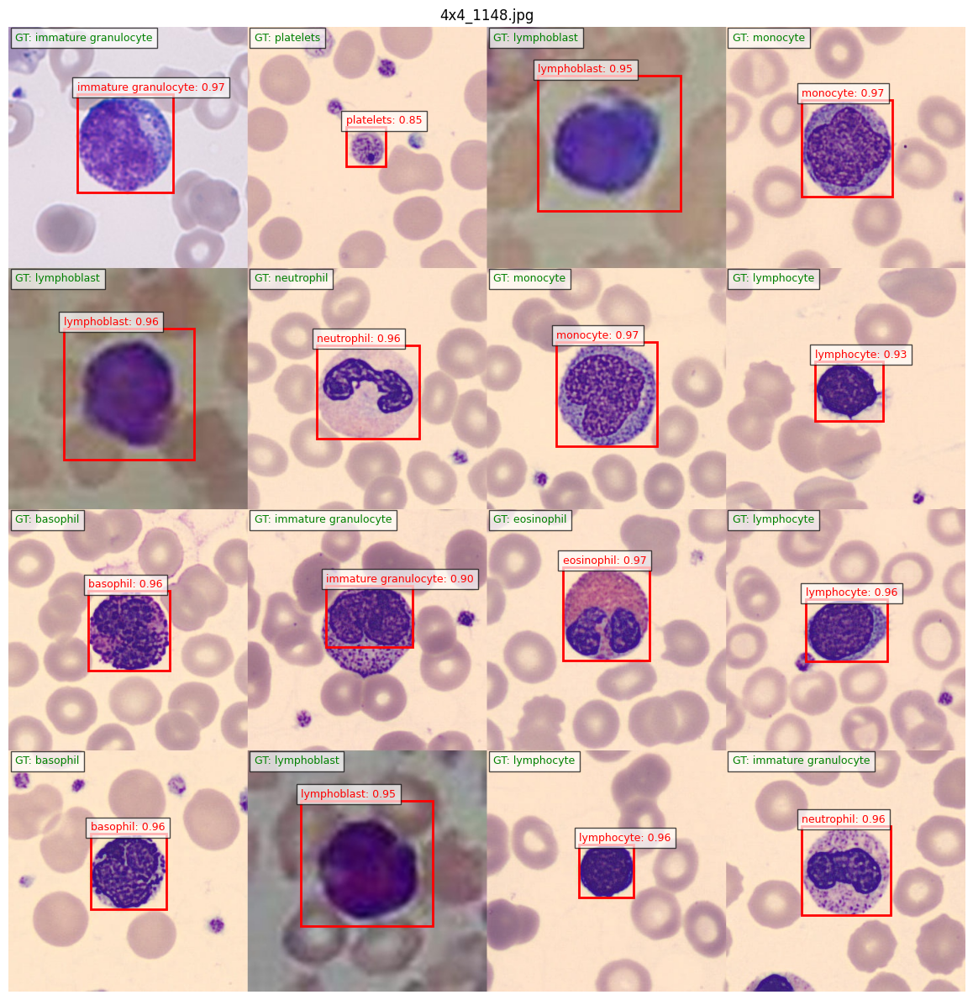

In [4]:
import os
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from ultralytics import YOLO
import re

def read_label_file(label_path):
    """
    Read YOLO format label file and return class indices
    Args:
        label_path: Path to label file
    Returns:
        list of class indices
    """
    classes = []
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                # YOLO format: class x_center y_center width height
                parts = line.strip().split()
                if len(parts) >= 5:
                    class_idx = int(parts[0])
                    classes.append(class_idx)
    return classes

def extract_grid_info(filename):
    """
    Extract grid size from filename (e.g., '2x2_1291' -> (2, 2))
    """
    match = re.match(r'(\d+)x(\d+)_', filename)
    if match:
        rows = int(match.group(1))
        cols = int(match.group(2))
        return (rows, cols)
    else:
        # Default to 1x1 if no pattern is found
        return (1, 1)

%matplotlib inline 

# Load the trained model
model = YOLO("/Users/afnanag/projects/DH307/yolov11/runs/detect/train9/weights/best.pt")

# Path to validation images and labels
val_img_dir = "/Users/afnanag/projects/DH307/yolov11/augmentation/composite_data/val/images"
val_label_dir = val_img_dir.replace('images', 'labels')

# Get all image files in the validation directory
image_files = [f for f in os.listdir(val_img_dir) if f.endswith((".jpg", ".png", ".jpeg"))]

# Randomly select one image
img_name = random.choice(image_files)
img_path = os.path.join(val_img_dir, img_name)
label_path = os.path.join(val_label_dir, os.path.splitext(img_name)[0] + '.txt')

# Load image
image = cv2.imread(img_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
height, width = image.shape[:2]

# Extract grid size from the filename
grid_size = extract_grid_info(img_name)
rows, cols = grid_size

print(f"Detected grid size from filename: {rows}x{cols}")

# Calculate cell dimensions
cell_height = height // rows
cell_width = width // cols

# Define cells
cells = []
for r in range(rows):
    for c in range(cols):
        y_start = r * cell_height
        x_start = c * cell_width
        y_end = (r + 1) * cell_height if r < rows - 1 else height
        x_end = (c + 1) * cell_width if c < cols - 1 else width
        cells.append((y_start, y_end, x_start, x_end))

# Run prediction on the entire image
results = model(img_path)
result = results[0]

# Get ground truth labels
gt_class_indices = read_label_file(label_path)
gt_class_names = [model.names[idx] for idx in gt_class_indices]

# Extract prediction bounding boxes
pred_boxes = result.boxes.xyxy.cpu().numpy()
pred_confidences = result.boxes.conf.cpu().numpy()
pred_class_indices = result.boxes.cls.cpu().numpy()

# Create a figure
plt.figure(figsize=(12, 12))
plt.imshow(image_rgb)
plt.axis('off')

# Dictionary to store classes found in each cell
cell_gt_classes = {i: [] for i in range(len(cells))}
cell_pred_classes = {i: [] for i in range(len(cells))}

# Get the label file content to extract full YOLO annotations
full_labels = []
if os.path.exists(label_path):
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) >= 5:
                class_idx = int(parts[0])
                x_center = float(parts[1])
                y_center = float(parts[2])
                w = float(parts[3])
                h = float(parts[4])
                full_labels.append((class_idx, x_center, y_center, w, h))

# Process ground truth - assign classes to cells based on center point
for class_idx, x_center, y_center, w, h in full_labels:
    # Convert normalized coordinates to pixel values
    center_x = int(x_center * width)
    center_y = int(y_center * height)
    class_name = model.names[class_idx]
    
    # Determine which cell this ground truth belongs to
    for i, (y_start, y_end, x_start, x_end) in enumerate(cells):
        if x_start <= center_x < x_end and y_start <= center_y < y_end:
            cell_gt_classes[i].append(class_name)
            break

# Process predictions - assign to cells based on bounding box centers
for box, conf, class_idx in zip(pred_boxes, pred_confidences, pred_class_indices):
    x1, y1, x2, y2 = map(int, box)
    center_x = (x1 + x2) // 2
    center_y = (y1 + y2) // 2
    class_name = model.names[int(class_idx)]
    
    # Draw prediction bounding box
    plt.gca().add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, 
                                     fill=False, edgecolor='red', linewidth=2))
    
    # Add prediction label
    plt.text(x1, y1-5, f"{class_name}: {conf:.2f}", 
             color='red', fontsize=9, 
             bbox=dict(facecolor='white', alpha=0.7))
    
    # Determine which cell this prediction belongs to
    for i, (y_start, y_end, x_start, x_end) in enumerate(cells):
        if x_start <= center_x < x_end and y_start <= center_y < y_end:
            cell_pred_classes[i].append(class_name)
            break

# # Draw grid lines
# for r in range(1, rows):
#     y = r * cell_height
#     plt.axhline(y=y, color='blue', linestyle='-', alpha=0.5)

# for c in range(1, cols):
#     x = c * cell_width
#     plt.axvline(x=x, color='blue', linestyle='-', alpha=0.5)

# Add ground truth text for each cell
for i, (y_start, y_end, x_start, x_end) in enumerate(cells):
    # Count classes in this cell
    gt_classes = cell_gt_classes[i]
    gt_counts = {}
    for cls in gt_classes:
        gt_counts[cls] = gt_counts.get(cls, 0) + 1
    
    # Format ground truth text
    
    if gt_counts:
        gt_text = "GT: " + ", ".join([f"{cls}" for cls, count in gt_counts.items()])
    else:
        gt_text = "GT: none"
    
    # Add text at the top of each cell
    plt.text(x_start + 10, y_start + 20, gt_text, fontsize=9, color='green',
             bbox=dict(facecolor='white', alpha=0.7))

plt.title(f"{img_name}", fontsize=12)
plt.tight_layout()
plt.show()